In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml
import time
import gget
import pickle
from scipy.spatial.distance import cdist
import scipy
from scipy.stats import zscore
from tqdm import tqdm
from statsmodels.stats.multitest import multipletests
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from adjustText import adjust_text
from matplotlib.colors import LinearSegmentedColormap
import matplotlib as mpl

import anndata as an
import scanpy as sc
import scanpy.external as sce
import rapids_singlecell as rsc
import scvi

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy.stats import linregress

import cupy as cp
from cuml.manifold import TSNE
from cuml.decomposition import PCA

sc.settings.verbosity = 2

In [2]:
%%time
path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_all_groups.h5ad"
adata = sc.read_h5ad(path)
sc.logging.print_memory_usage()
adata

Memory usage: current 2.92 GB, difference +2.92 GB
CPU times: user 304 ms, sys: 1.3 s, total: 1.6 s
Wall time: 4.64 s


/nfs/turbo/umms-indikar/Jillian/conda-envs/rapids/lib/python3.13/site-packages/anndata/logging.py:57: FutureWarning: The specified parameters ('newline',) are no longer positional. Please specify them like `newline=False`
  print(format_memory_usage(get_memory_usage(), msg, newline))


AnnData object with n_obs × n_vars = 15950 × 25042
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'leiden_split'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'filter_pass', 'highly_variable', 'highly_variable_rank', 'm

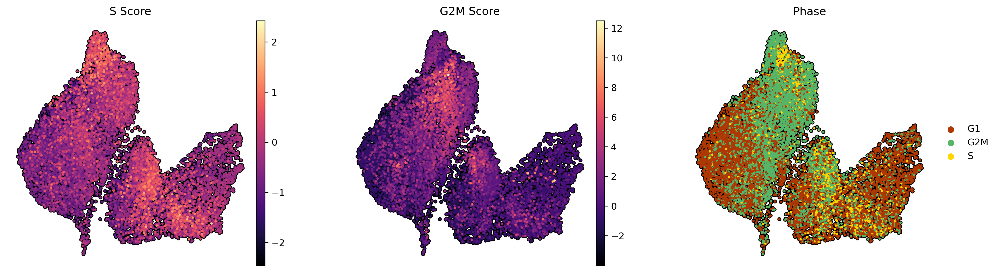

In [3]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4.75, 4.75

sc.pl.umap(
    adata, 
    color=['S_score', 'G2M_score', 'phase'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    cmap='magma',
    outline_color=('k', 'k'),
    title=['S Score', 'G2M Score', 'Phase'],
    frameon=False,
    wspace=0.25,
)

In [4]:
low = '#131317' # dark
mid = '#3B80EB' # blue
high = '#F2D123' # yellow

custom_cmap = LinearSegmentedColormap.from_list(
    "custom_cmap",
    [(0.0, low), (0.15, low), (0.5, mid), (0.85, high), (1.0, high)]
)

regev_genes = [x.strip() for x in open('../../resources/regev_lab_cell_cycle_genes.txt')]
s_genes = regev_genes[:43]
g2m_genes = regev_genes[43:]

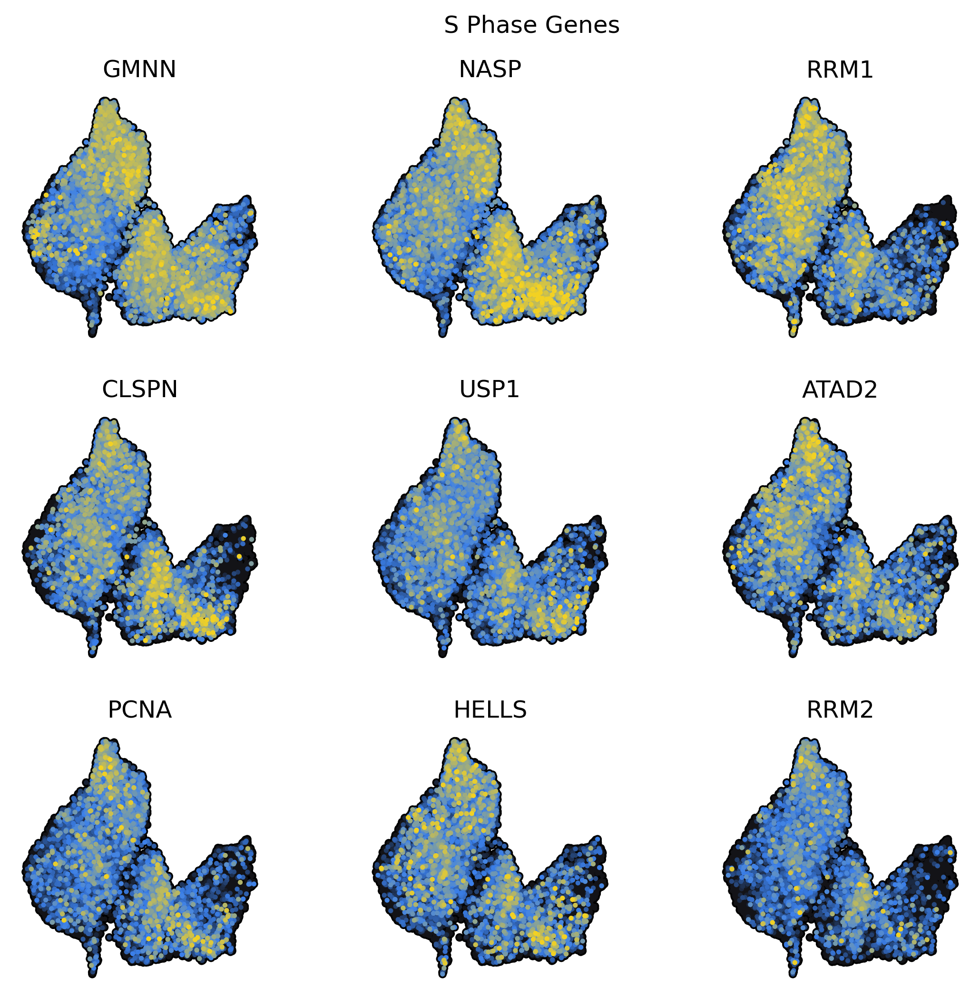

In [5]:
# get higest expressed S phase genes
adata.X = adata.layers['log_norm'].copy()

s_genes = [g for g in s_genes if g in adata.var_names]

mean_expr = adata[:, s_genes].X.mean(axis=0).A1  
top9_genes = [s_genes[i] for i in mean_expr.argsort()[::-1][:9]]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2, 2.5

fig = sc.pl.umap(
    adata, 
    color=top9_genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    cmap=custom_cmap,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    show=False, 
    return_fig=True,  
)

fig.suptitle("S Phase Genes", y=0.95)
plt.show()

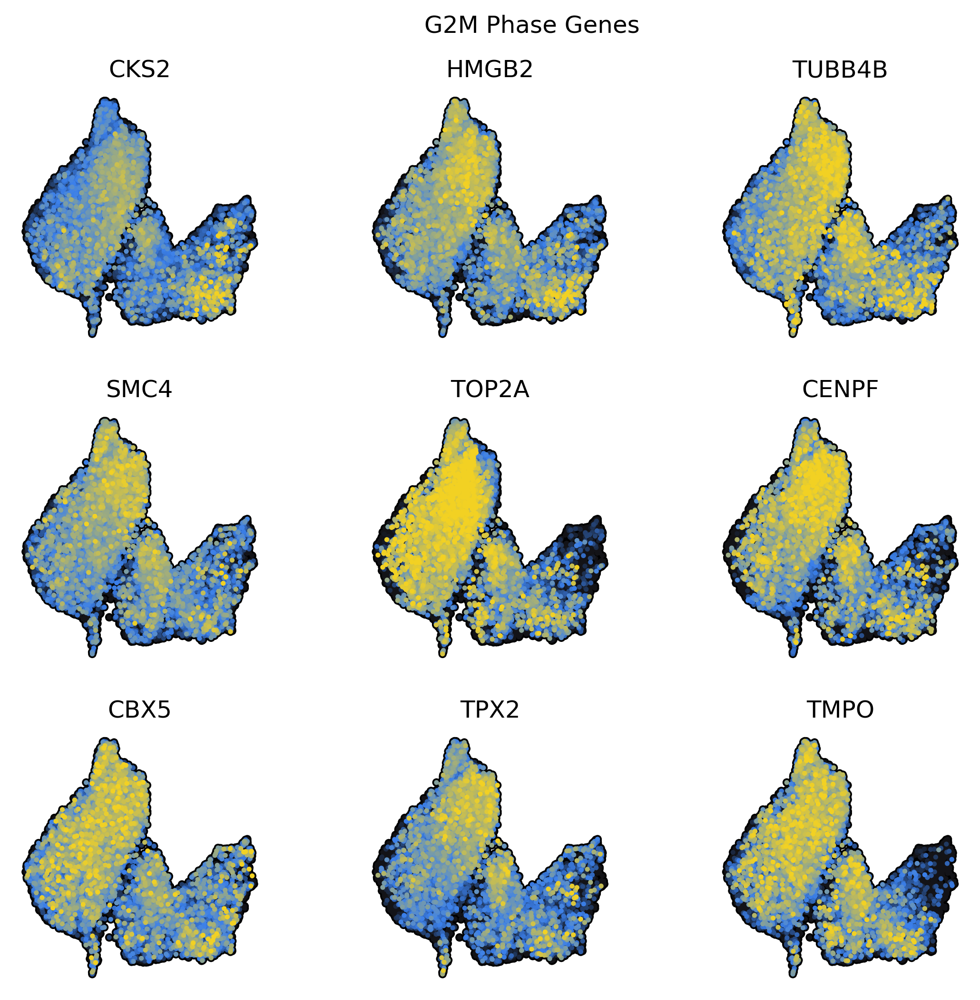

In [6]:
# get higest expressed G2M phase genes

g2m_genes = [g for g in g2m_genes if g in adata.var_names]

mean_expr = adata[:, g2m_genes].X.mean(axis=0).A1  
top9_genes = [g2m_genes[i] for i in mean_expr.argsort()[::-1][:9]]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2, 2.5

fig = sc.pl.umap(
    adata, 
    color=top9_genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    cmap=custom_cmap,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
    show=False, 
    return_fig=True,  
)

fig.suptitle("G2M Phase Genes", y=0.95)
plt.show()

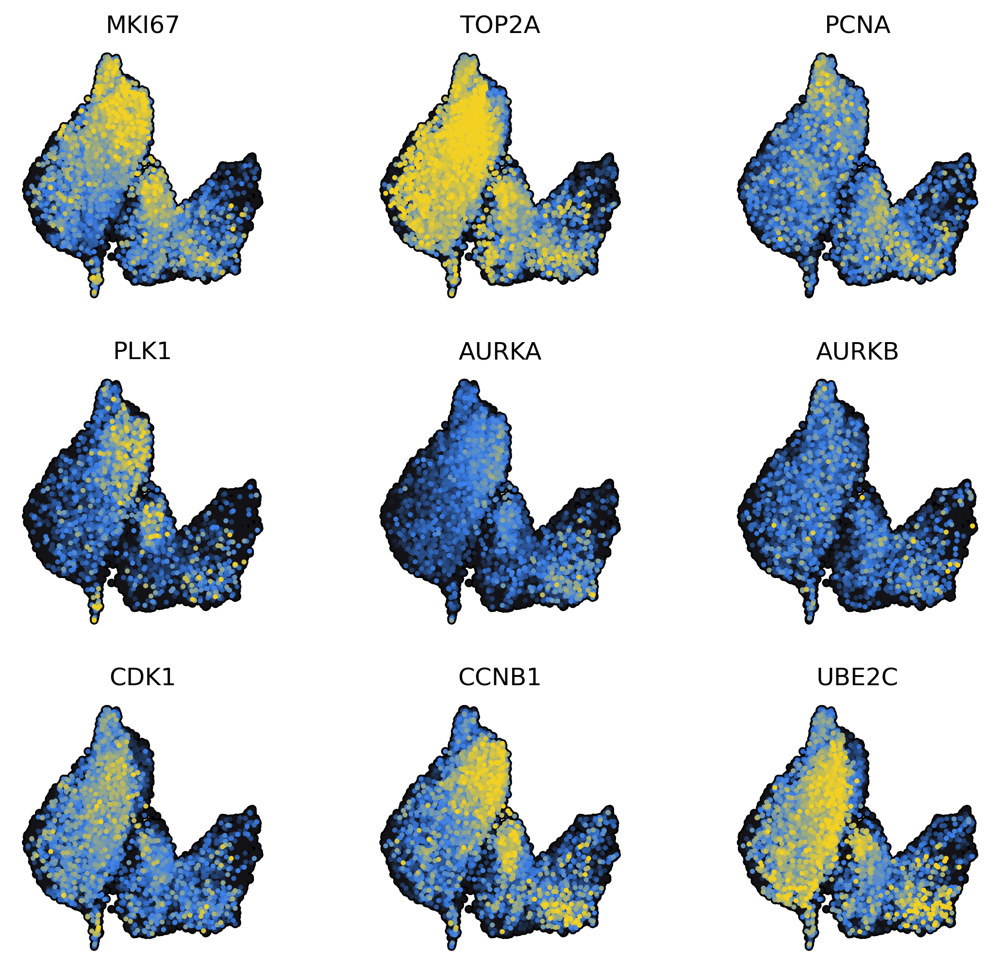

In [10]:
genes = ['MKI67', 'TOP2A', 'PCNA', 'PLK1', 'AURKA', 'AURKB', 'CDK1', 'CCNB1', 'UBE2C']

sc.pl.umap(
    adata, 
    color=genes,
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    na_in_legend=False,
    cmap=custom_cmap,
    colorbar_loc=None,
    outline_color=('k', 'k'),
    frameon=False,
)

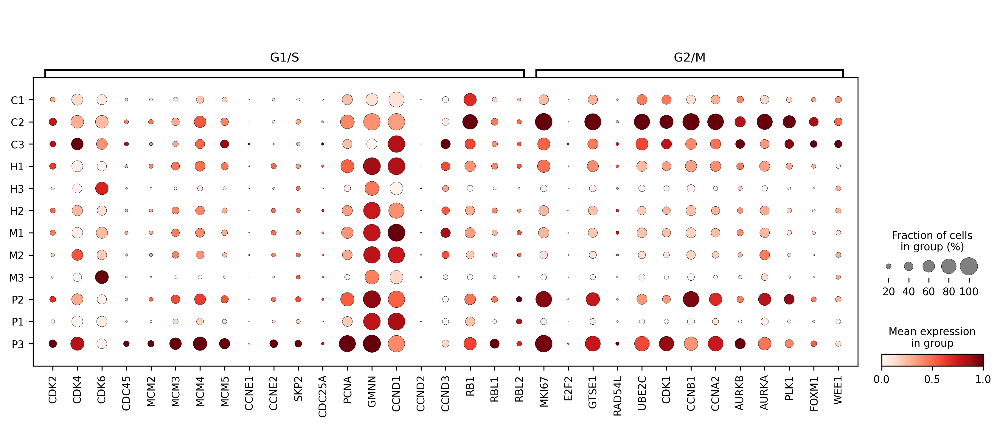

In [16]:
genes_to_plot = {
    'G1/S': ['CDK2', 'CDK4', 'CDK6', 'CDC45', 'MCM2', 'MCM3', 'MCM4', 'MCM5', 'CCNE1', 'CCNE2', 'SKP2', 'CDC25A', 'PCNA',
             'GMNN', 'CCND1', 'CCND2', 'CCND3', 'RB1', 'RBL1', 'RBL2'],
    'G2/M': ['MKI67', 'E2F2', 'GTSE1', 'RAD54L', 'UBE2C', 'CDK1', 'CCNB1', 'CCNA2', 'AURKB', 'AURKA', 'PLK1', 'FOXM1', 'WEE1'],
}

sc.pl.dotplot(
    adata,
    groupby='leiden_split',
    var_names=genes_to_plot,
    layer='log_norm',
    standard_scale='var',
)

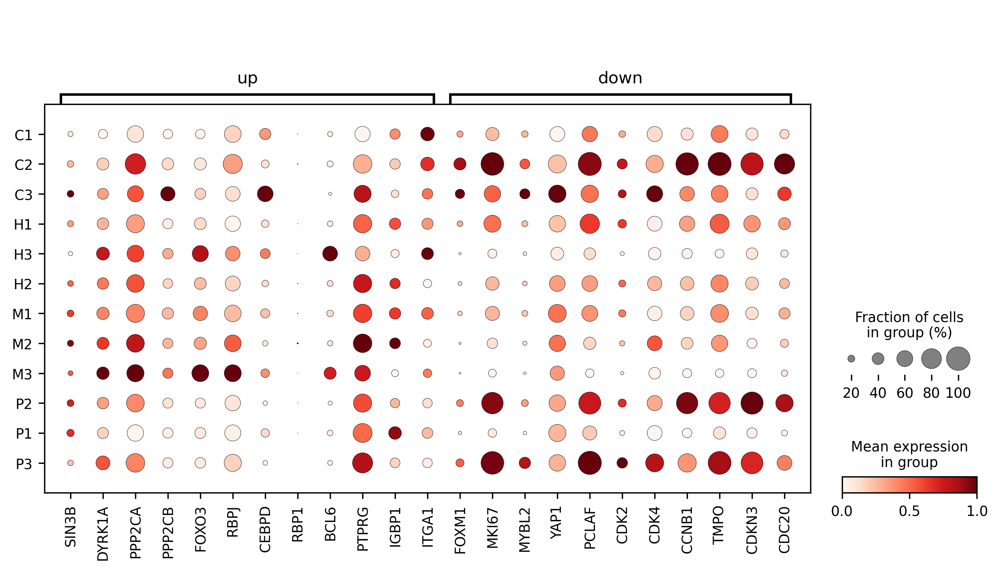

In [17]:
genes_to_plot = {
    'up': ['SIN3B', 'DYRK1A', 'PPP2CA', 'PPP2CB', 'FOXO3', 'RBPJ', 'CEBPD', 'RBP1', 'BCL6', 'PTPRG', 'IGBP1', 'ITGA1'],
    'down': ['FOXM1', 'MKI67', 'MYBL2', 'YAP1', 'PCLAF', 'CDK2', 'CDK4', 'CCNB1', 'TMPO', 'CDKN3', 'CDC20'],
}

sc.pl.dotplot(
    adata,
    groupby='leiden_split',
    var_names=genes_to_plot,
    layer='log_norm',
    standard_scale='var',
)